In [ ]:
!pip install  ultralytics

In [1]:
import ast
import os, cv2
from skimage import io
from matplotlib import pyplot as plt
import pandas as pd
import numpy as np
import ultralytics
import torch

In [2]:

train_folder = '/kaggle/input/train'  # Your train folder
image_folder = os.path.join(train_folder, 'images')
label_folder = os.path.join(train_folder, 'labels')

# Load all .txt label files
label_files = [f for f in os.listdir(label_folder) if f.endswith('.txt')]

# Initialize list to hold data
data = []

# Parse the YOLO label format and extract class and bounding box information
for file in label_files:
    file_path = os.path.join(label_folder, file)
    with open(file_path, 'r') as f:
        for line in f:
            elements = line.strip().split()
            # Ensure the line has exactly 5 elements (class ID and 4 bounding box values)
            if len(elements) == 5:
                class_id = int(elements[0])  # The class label (integer)
                try:
                    x_center, y_center, width, height = map(float, elements[1:])  # YOLO format bbox
                    # Append the current file name and its corresponding data
                    data.append([file, class_id, x_center, y_center, width, height])
                except ValueError as e:
                    print(f"Error parsing bounding box values in file {file}: {e}")
            else:
                print(f"Skipping malformed line in file {file}: {line}")

# Create a DataFrame for analysis
columns = ['file', 'class_id', 'x_center', 'y_center', 'width', 'height']
df = pd.DataFrame(data, columns=columns)



Skipping malformed line in file IMG_7449_jpg.rf.4a122e02617e3a9ed18be9bf27214353.txt: 0 0 0 0 1 1 1 1 0 0 0


In [3]:
df

,file,class_id,x_center,y_center,width,height
0,TCGA-DE-A4MD-01Z-00-DX1_324_jpg.rf.e45735786e2...,1,0.857812,0.150000,0.107031,0.101562
1,TCGA-DE-A4MD-01Z-00-DX1_324_jpg.rf.e45735786e2...,1,0.580469,0.515625,0.135156,0.140625
2,TCGA-DE-A4MD-01Z-00-DX1_324_jpg.rf.e45735786e2...,1,0.079687,0.191406,0.107031,0.096094
3,TCGA-DE-A4MD-01Z-00-DX1_324_jpg.rf.e45735786e2...,1,0.361719,0.822656,0.109375,0.140625
4,TCGA-DE-A4MD-01Z-00-DX1_324_jpg.rf.e45735786e2...,1,0.572656,0.502344,0.078125,0.119531
...,...,...,...,...,...,...
4535,TCGA-EL-A3GP-01Z-00-DX1_270_jpg.rf.1a135b183de...,1,0.857812,0.757812,0.117188,0.119531
4536,TCGA-EL-A3GP-01Z-00-DX1_270_jpg.rf.1a135b183de...,1,0.867188,0.289062,0.130469,0.146094
4537,TCGA-EL-A3GP-01Z-00-DX1_270_jpg.rf.1a135b183de...,1,0.669531,0.847656,0.062500,0.091406
4538,TCGA-EL-A3GP-01Z-00-DX1_270_jpg.rf.1a135b183de...,1,0.728125,0.876563,0.075781,0.075781


Visualizing for class in file: TCGA-DE-A4MD-01Z-00-DX1_324_jpg.rf.e45735786e283a2ae0189245fc8dc529.txt


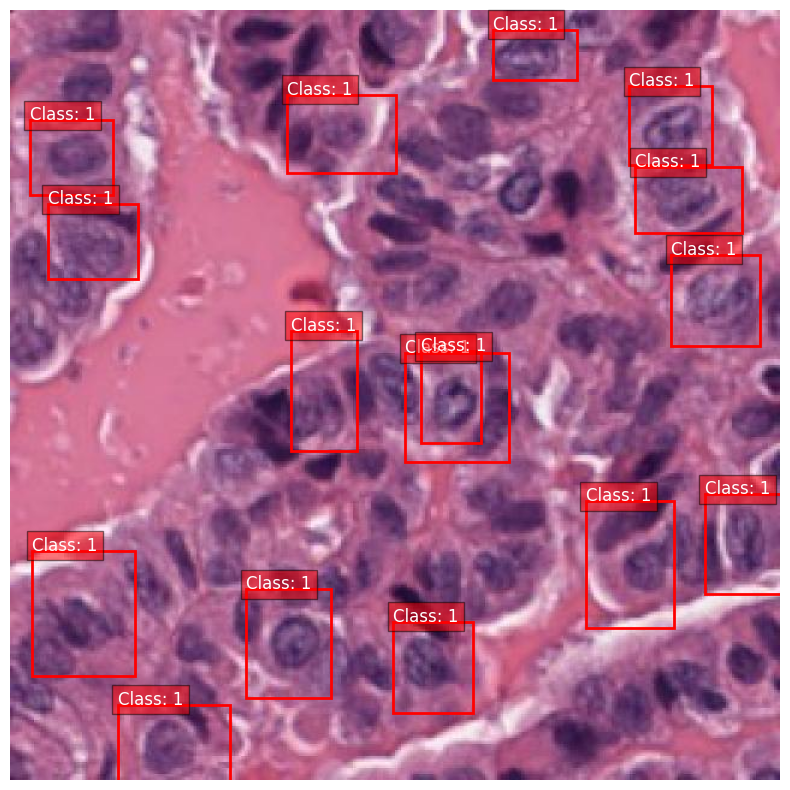

Visualizing for class in file: TCGA-DJ-A1QD-01Z-00-DX1_186_jpg.rf.19617705c9b86ed13087138abd267626.txt


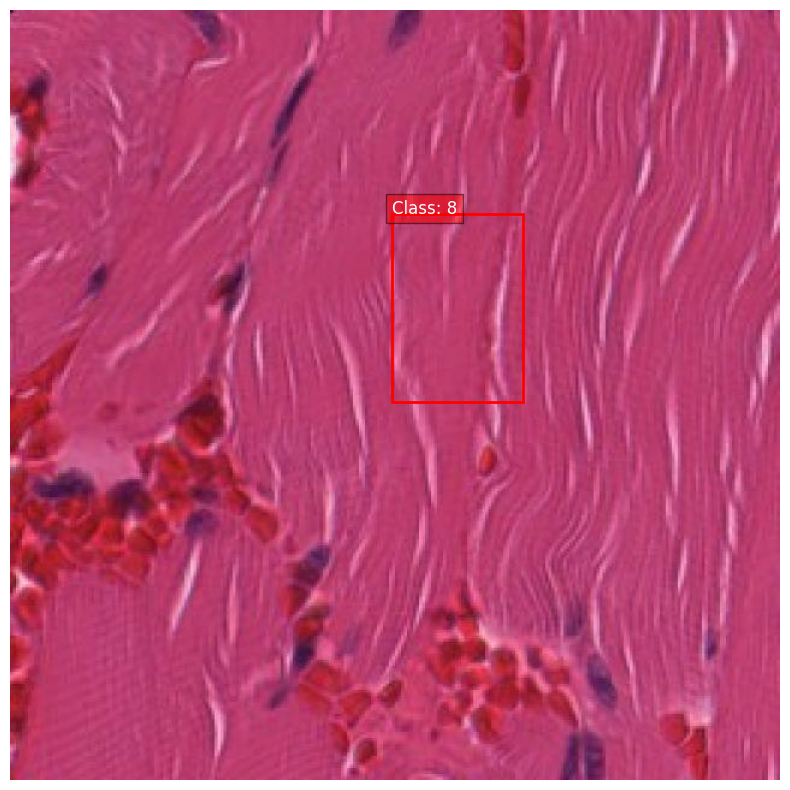

Visualizing for class in file: TCGA-DJ-A3UX-01Z-00-DX1_715_jpg.rf.cceec0613ff9a5c6fbc3ba709f6bda0c.txt


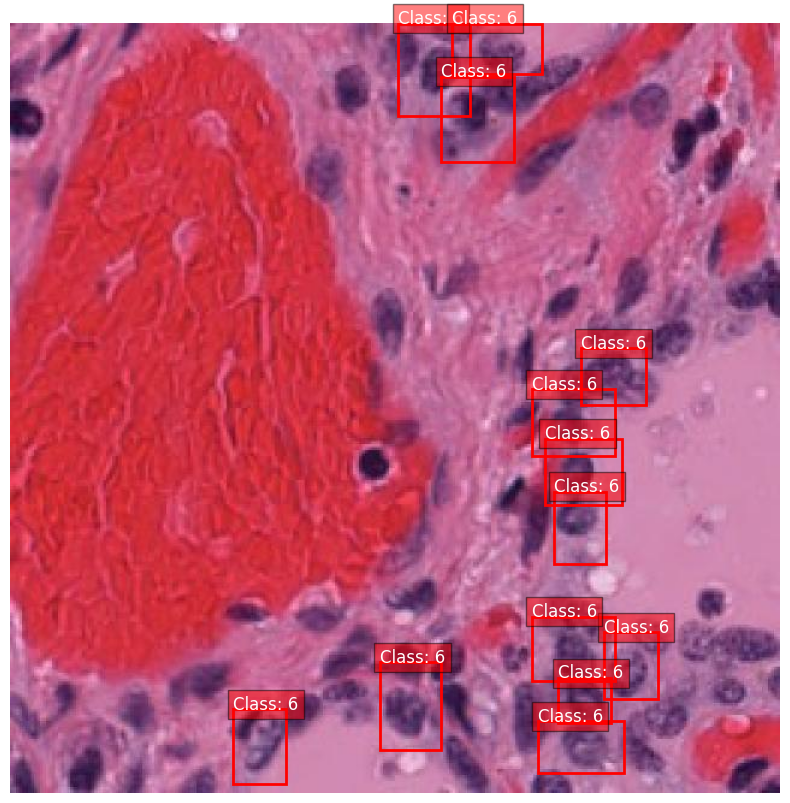

Visualizing for class in file: TCGA-BJ-A45K-01Z-00-DX1_392_jpg.rf.ef871c6d631f6756a07c22c911bab7bb.txt


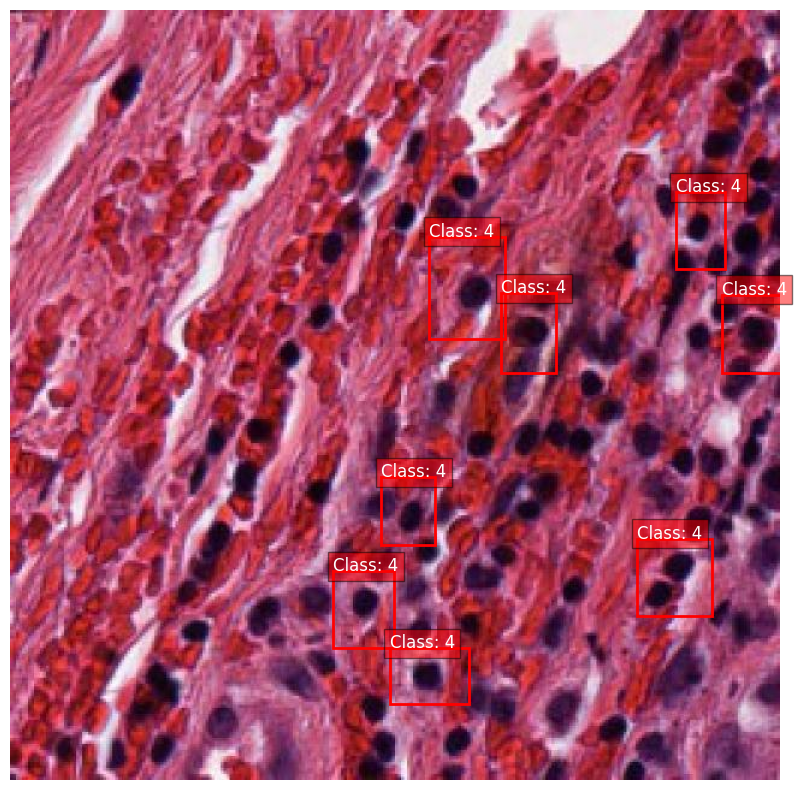

Visualizing for class in file: IMG_7406_jpg.rf.aeb92f8b457b7beee48cac919ee63422.txt


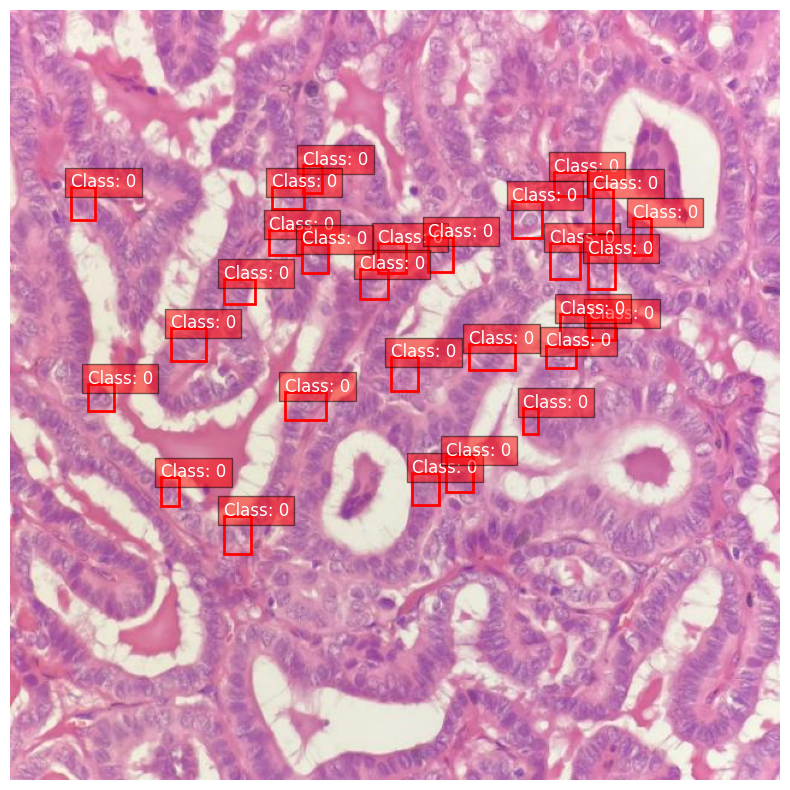

Visualizing for class in file: TCGA-BJ-A28Z-01Z-00-DX1_417_jpg.rf.e1b013b8def91d71f0107877b20f1c9f.txt


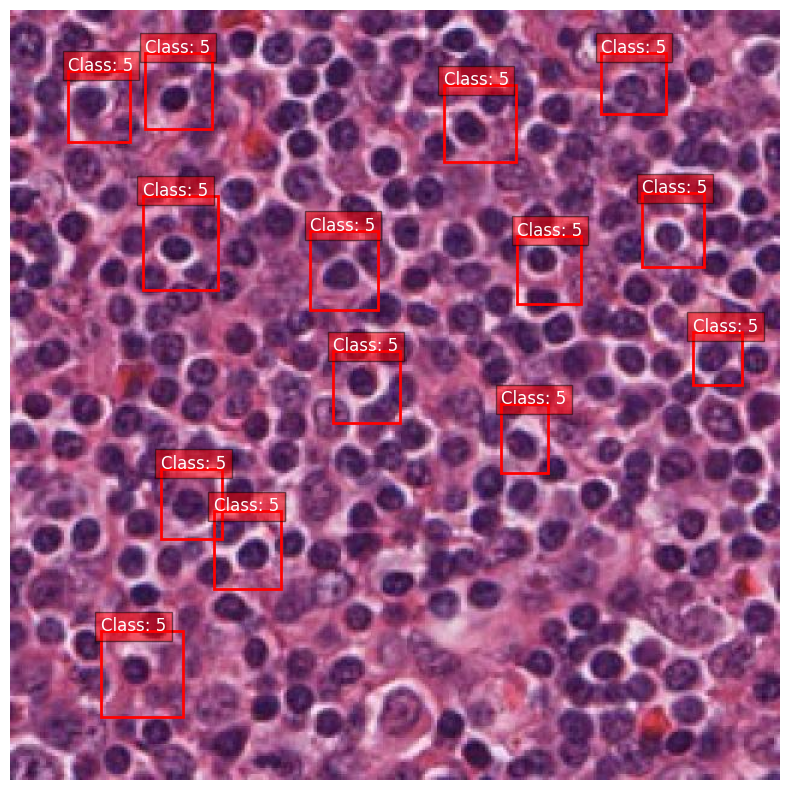

Visualizing for class in file: TCGA-EL-A3GR-01Z-00-DX1_862_jpg.rf.2a07945afca9475aa2d90c1dc4cfd672.txt


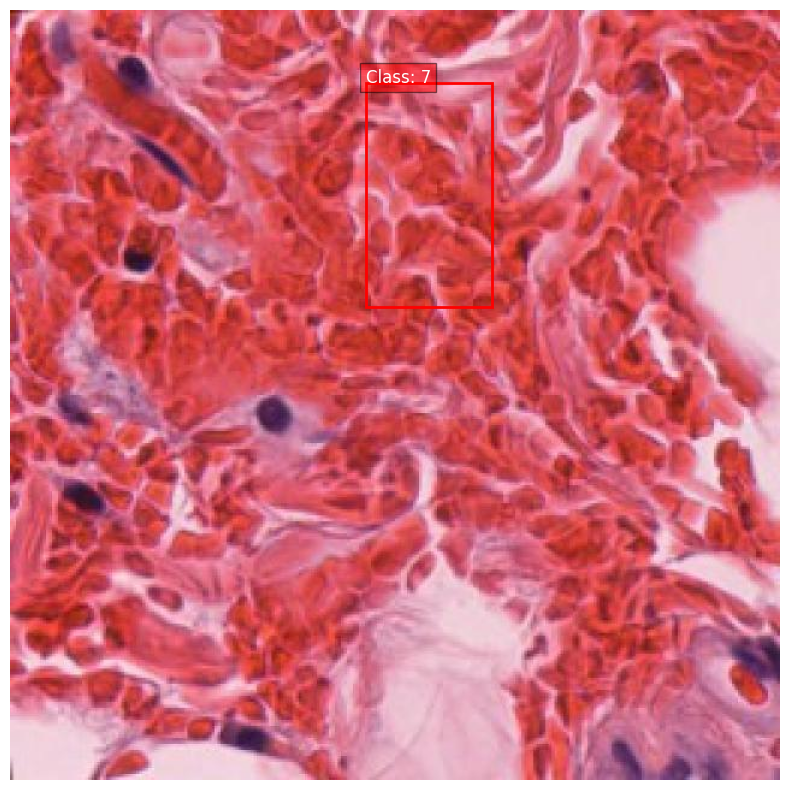

Visualizing for class in file: TCGA-DJ-A2QA-01Z-00-DX1_504_jpg.rf.60c91deba4b276085df542b66e3afa2c.txt


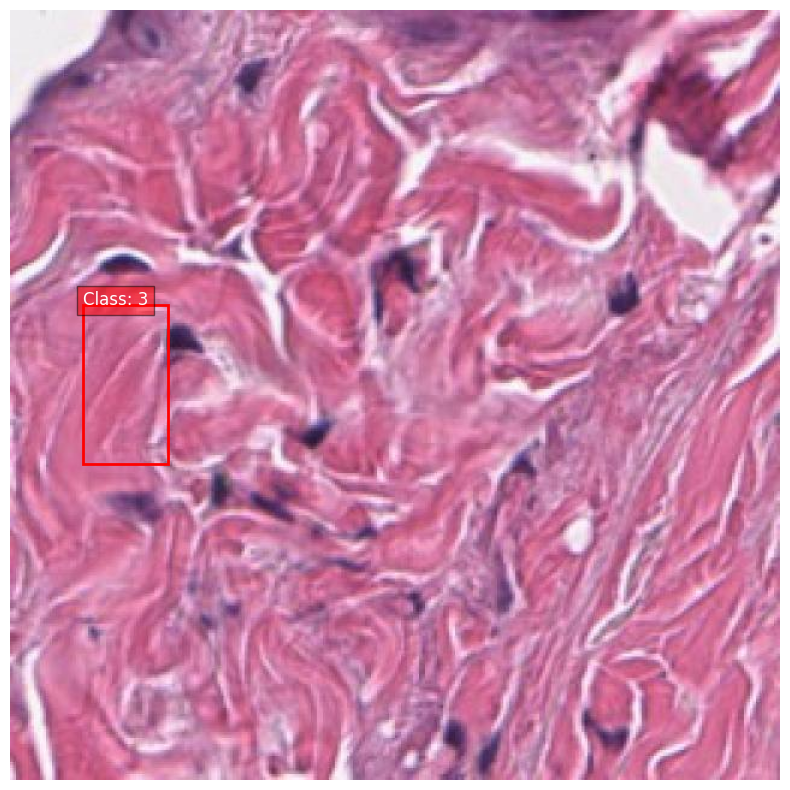

Visualizing for class in file: TCGA-E8-A417-01Z-00-DX1_128_jpg.rf.c49e1eea38dc3d3a40541afe7ee0eea5.txt


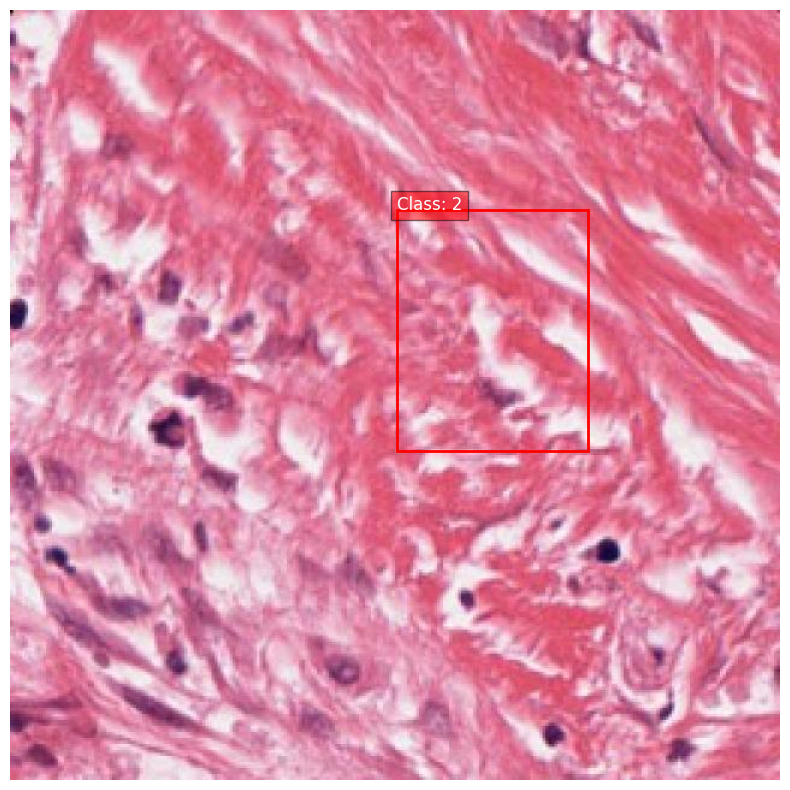

In [4]:
import cv2
import matplotlib.pyplot as plt
import os

def plot_bboxes(image_file, df, image_folder):
    img_path = os.path.join(image_folder, image_file.replace(".txt", ".jpg"))  # Adjust if images have a different extension
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for proper color display in matplotlib
    
    if img is None:
        print(f"Image not found for file {image_file}")
        return
    
    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    
    # Filter the bounding boxes for the specific image (file)
    image_bboxes = df[df['file'] == image_file]
    
    # Get image dimensions
    img_height, img_width, _ = img.shape
    
    # Plot each bounding box
    for _, row in image_bboxes.iterrows():
        class_id, x_center, y_center, width, height = row[['class_id', 'x_center', 'y_center', 'width', 'height']]
        
        # Convert YOLO format to pixel values
        xmin = int((x_center - width / 2) * img_width)
        ymin = int((y_center - height / 2) * img_height)
        xmax = int((x_center + width / 2) * img_width)
        ymax = int((y_center + height / 2) * img_height)
        
        # Draw the rectangle (bounding box)
        plt.gca().add_patch(plt.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin, 
                                          linewidth=2, edgecolor='r', facecolor='none'))
        # Annotate with class ID
        plt.text(xmin, ymin, f"Class: {class_id}", color='white', fontsize=12, 
                 bbox=dict(facecolor='red', alpha=0.5))
    
    plt.axis('off')
    plt.show()

# Find one representative image for each class
unique_classes = df['class_id'].unique()
representative_files = []

for class_id in unique_classes:
    # Find the first file that contains this class
    file_for_class = df[df['class_id'] == class_id]['file'].iloc[0]
    if file_for_class not in representative_files:
        representative_files.append(file_for_class)

# Plot the bounding boxes for one image per class
for file in representative_files:
    print(f"Visualizing for class in file: {file}")
    plot_bboxes(file, df, image_folder)


In [5]:

import shutil

# Define the paths
train_folder = '/kaggle/input/train'  # Your train folder
label_folder = os.path.join(train_folder, 'labels')

# Define a new writable folder for modified labels
new_label_folder = '/kaggle/working/modified_labels'
os.makedirs(new_label_folder, exist_ok=True)

# Load all .txt label files
label_files = [f for f in os.listdir(label_folder) if f.endswith('.txt')]

# Initialize list to hold data
data = []

# List of class IDs to keep (TC=0, abnormal=1, normal=6)
classes_to_keep = [0,6]

# Parse the YOLO label format and extract class and bounding box information
for file in label_files:
    file_path = os.path.join(label_folder, file)
    new_file_path = os.path.join(new_label_folder, file)
    
    with open(file_path, 'r') as f:
        lines_to_keep = []
        for line in f:
            elements = line.strip().split()
            # Ensure the line has exactly 5 elements (class ID and 4 bounding box values)
            if len(elements) == 5:
                class_id = int(elements[0])  # The class label (integer)
                if class_id in classes_to_keep:  # Keep only the desired classes
                    try:
                        x_center, y_center, width, height = map(float, elements[1:])  # YOLO format bbox
                        # Store valid lines with selected classes
                        lines_to_keep.append(f"{class_id} {x_center} {y_center} {width} {height}\n")
                        # Append the current file name and its corresponding data to the DataFrame
                        data.append([file, class_id, x_center, y_center, width, height])
                    except ValueError as e:
                        print(f"Error parsing bounding box values in file {file}: {e}")
            else:
                print(f"Skipping line in file {file} due to class: {line}")
        
        # Write the filtered labels to the new writable folder
        if lines_to_keep:
            with open(new_file_path, 'w') as f_out:
                f_out.writelines(lines_to_keep)

# Create a DataFrame for analysis
columns = ['file', 'class_id', 'x_center', 'y_center', 'width', 'height']
df1 = pd.DataFrame(data, columns=columns)

# Display the first few rows of the filtered dataset
print(df1.head())


Skipping line in file IMG_7449_jpg.rf.4a122e02617e3a9ed18be9bf27214353.txt due to class: 0 0 0 0 1 1 1 1 0 0 0
                                                file  class_id  x_center  \
0  TCGA-DJ-A3UX-01Z-00-DX1_715_jpg.rf.cceec0613ff...         6  0.740625   
1  TCGA-DJ-A3UX-01Z-00-DX1_715_jpg.rf.cceec0613ff...         6  0.550000   
2  TCGA-DJ-A3UX-01Z-00-DX1_715_jpg.rf.cceec0613ff...         6  0.805469   
3  TCGA-DJ-A3UX-01Z-00-DX1_715_jpg.rf.cceec0613ff...         6  0.731250   
4  TCGA-DJ-A3UX-01Z-00-DX1_715_jpg.rf.cceec0613ff...         6  0.745313   

   y_center     width    height  
0  0.655469  0.067187  0.094531  
1  0.060937  0.093750  0.120313  
2  0.834375  0.070312  0.085938  
3  0.811719  0.107813  0.082812  
4  0.879687  0.068750  0.057031  


In [6]:
(df1['class_id'].value_counts()/df1.shape[0])*100

class_id
6    62.737987
0    37.262013
Name: count, dtype: float64

<Axes: xlabel='class_id', ylabel='count'>

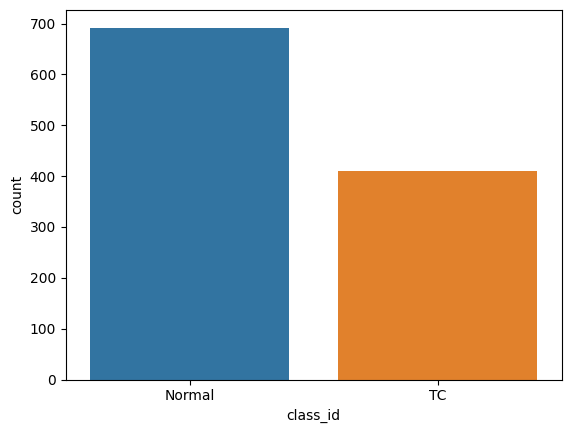

In [7]:
import seaborn as sns
mapping = {0: 'TC', 6: 'Normal'}

# Apply the mapping to the class_id column
df1['class_id'] = df1['class_id'].map(mapping)

# Create a countplot to visualize the frequency of each class_id after renaming
sns.countplot(x='class_id', data=df1)

In [8]:
import os
import shutil
import pandas as pd
from sklearn.model_selection import train_test_split

# Define paths
original_image_folder = '/kaggle/input/train/images'  # Original images path
original_label_folder = '/kaggle/input/train/labels'  # Original labels path
base_folder = '/kaggle/working/thyroid_dataset'  # Base folder for the new dataset

# Create the directory structure
os.makedirs(os.path.join(base_folder, 'train/images'), exist_ok=True)
os.makedirs(os.path.join(base_folder, 'train/labels'), exist_ok=True)
os.makedirs(os.path.join(base_folder, 'val/images'), exist_ok=True)
os.makedirs(os.path.join(base_folder, 'val/labels'), exist_ok=True)
os.makedirs(os.path.join(base_folder, 'test/images'), exist_ok=True)
os.makedirs(os.path.join(base_folder, 'test/labels'), exist_ok=True)

# Load the label files into a DataFrame
label_files = [f for f in os.listdir(original_label_folder) if f.endswith('.txt')]
data = []

# Define class mapping (0 for TC, 1 for Normal)
class_mapping = {'TC': 0, 'Normal': 1}

# Filter for only 'TC' and 'Normal'
for label_file in label_files:
    label_path = os.path.join(original_label_folder, label_file)
    with open(label_path, 'r') as f:
        for line in f:
            elements = line.strip().split()
            if len(elements) == 5:
                class_id = int(elements[0])
                if class_id in class_mapping.values():  # Keep only the desired classes
                    data.append((label_file, class_id))

# Create a DataFrame
df = pd.DataFrame(data, columns=['file', 'class_id'])
df['file'] = df['file'].str.replace('.txt', '.jpg')  # Assuming images are in JPG format

# Split the data
train_df, temp_df = train_test_split(df, test_size=0.3, random_state=42)
val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42)

# Function to copy files
def copy_files(file_list, folder):
    for file in file_list['file']:
        image_src = os.path.join(original_image_folder, file)
        label_src = os.path.join(original_label_folder, file.replace('.jpg', '.txt'))
        shutil.copy(image_src, os.path.join(base_folder, folder, 'images', file))
        shutil.copy(label_src, os.path.join(base_folder, folder, 'labels', file.replace('.jpg', '.txt')))

# Copy files to train, val, and test directories
copy_files(train_df, 'train')
copy_files(val_df, 'val')
copy_files(test_df, 'test')

# Create data.yaml file
data_yaml = """
train: /kaggle/working/thyroid_dataset/train/images
val: /kaggle/working/thyroid_dataset/val/images
test: /kaggle/working/thyroid_dataset/test/images

nc: 2  # Number of classes
names: ['TC', 'Normal']  # Class names
"""

with open(os.path.join(base_folder, 'data.yaml'), 'w') as f:
    f.write(data_yaml.strip())

print("Dataset structure created successfully with two classes!")


Dataset structure created successfully with two classes!


In [ ]:
ultralytics.checks()  # Ensure the environment is ready
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}")

In [ ]:
os.chdir('/kaggle/working')

In [ ]:
from ultralytics import YOLO

# Set device (optional, can specify 'cuda' if using GPU)
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Initialize the YOLO model
model = YOLO("yolov9c.pt")  # Use a pretrained YOLOv9 model
model.to(device)

# Train the model
model.train(
    data='/kaggle/working/thyroid_dataset/data.yaml',  # Path to your data configuration
    epochs=200,
    imgsz=640,  # Image size
    save_period=10,
    plots=True
)

print("Training completed!")


In [ ]:
# Validate the model on the validation set
metrics = model.val()

# Print the confusion matrix and performance metrics
print("Confusion Matrix:")
print(metrics.confusion_matrix.matrix)

print(metrics.results_dict)
print(f"mAP50 = {metrics.box.map50}")
print(f"mAP75 = {metrics.box.map75}")


In [ ]:
!zip -r file.zip /kaggle/working/

In [ ]:
from IPython.display import FileLink
FileLink(r'file.zip')